In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

In [2]:
import zipfile

path = "Datasets/yalefaces.zip"
zip_object = zipfile.ZipFile(file=path,mode="r")
zip_object.extractall("./")
zip_object.close()

In [3]:
import os

print(os.listdir("yalefaces/train")[:2])  # List all file in that dir

['subject08.wink.gif', 'subject09.wink.gif']


In [4]:
def get_image_data(data):
    paths = [os.path.join(f"yalefaces/{data}",f) for f in os.listdir(f"yalefaces/{data}")]
    faces = []
    ids = []
    for path in paths:
        image = Image.open(path).convert("L") # Single chanel
        image_np = np.array(image,"uint8")  # Convert to numpy
        id_ = int(os.path.split(path)[1].split(".")[0][-2:])
        ids.append(id_)
        faces.append(image_np)
    ids = np.array(ids)
    return ids,faces 

In [5]:
ids,faces = get_image_data("train")
len(ids),len(faces)

(135, 135)

### LBPH: Local Binary Patterns Histograms

In [6]:
# lbph_classifier = cv2.face.LBPHFaceRecognizer_create(radius=4,
#                                                      neighbors=14,
#                                                      grid_x=9,
#                                                      grid_y=9)
# lbph_classifier.train(faces,ids)
# lbph_classifier.write("LBPH/lbph_classifier.yml")

In [7]:
lbph_face_classifier = cv2.face.LBPHFaceRecognizer_create()
lbph_face_classifier.read("LBPH/lbph_classifier.yml")

In [8]:
test_image = "yalefaces/test/subject10.sad.gif"
image = Image.open(test_image).convert("L")
image_np = np.array(image,"uint8")
prediction,confidence = lbph_face_classifier.predict(image_np)
expected_output = int(test_image[22:24])
prediction,expected_output

(10, 10)

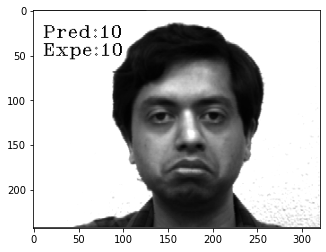

In [9]:
cv2.putText(image_np,f"Pred:{prediction}",
            (10,30),
            cv2.FONT_HERSHEY_COMPLEX_SMALL,
            1,(0,255,0))
cv2.putText(image_np,f"Expe:{expected_output}",
            (10,50),
            cv2.FONT_HERSHEY_COMPLEX_SMALL,
            1,(0,255,0))
plt.imshow(image_np,cmap="gray")
plt.show()

In [10]:
def predict_test_image(image_np,id_):
    prediction,confidence = lbph_face_classifier.predict(image_np)
    expected_output = id_
    predicted.append(prediction)
    expected.append(expected_output)
    cv2.putText(image_np,f"Pred:{prediction}",
                (10,30),
                cv2.FONT_HERSHEY_COMPLEX_SMALL,
                1,(0,255,0))
    cv2.putText(image_np,f"Expe:{expected_output}",
                (10,50),
                cv2.FONT_HERSHEY_COMPLEX_SMALL,
                1,(0,255,0))
    plt.imshow(image_np,cmap="gray")
    plt.show()
    return expected_output == prediction

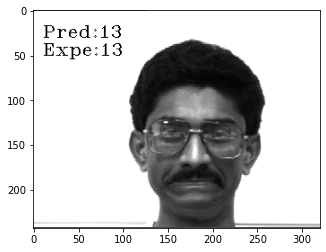

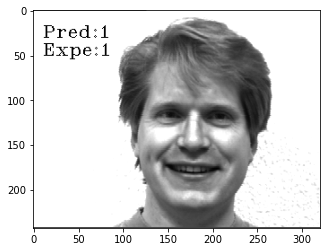

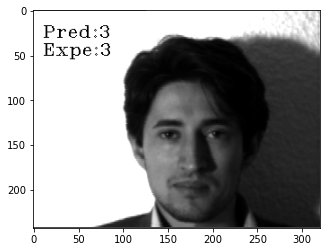

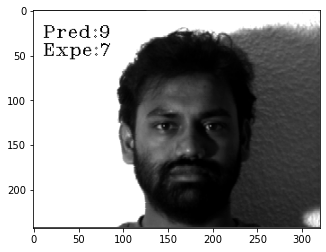

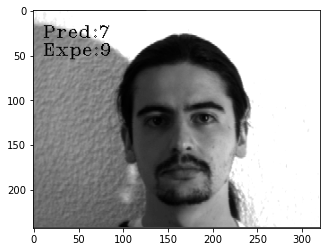

...

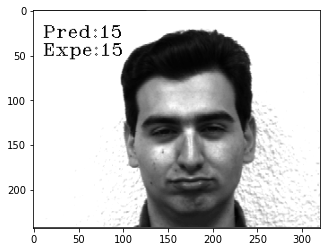

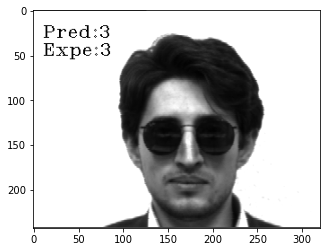

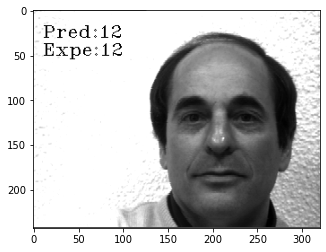

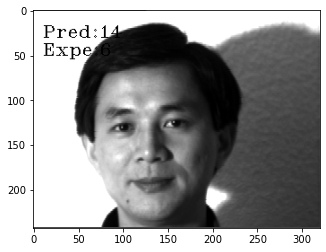

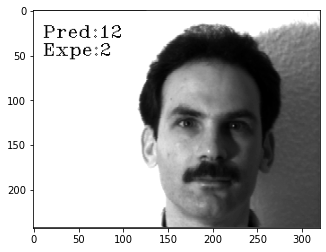

In [14]:
ids,faces = get_image_data("test")
evaluate_list = []
predicted = []
expected = []
for i,face in enumerate(faces):
    result = predict_test_image(face,ids[i])
    evaluate_list.append(result)

In [15]:
acc = evaluate_list.count(True)/len(evaluate_list)
print(f"Accuracy: {acc:.2f}")

Accuracy: 0.70


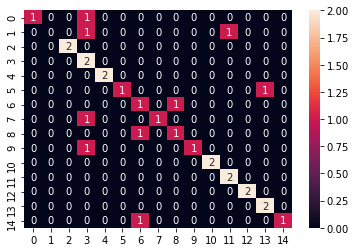

In [16]:
from sklearn.metrics import confusion_matrix
import seaborn

cm = confusion_matrix(expected,predicted)
seaborn.heatmap(cm,annot=True);

### Dlib: facial points

In [20]:
import dlib

face_detector = dlib.get_frontal_face_detector()
points_detector = dlib.shape_predictor("Weights/shape_predictor_68_face_landmarks.dat")

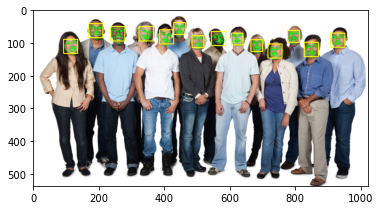

In [28]:
image = cv2.imread("Images/people2.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
face_detection = face_detector(image,1)
for face in face_detection:
    points = points_detector(image,face)
    for point in points.parts():
        cv2.circle(image,(point.x,point.y),2,(0,255,0),1)
    l,t,r,b = face.left(),face.top(),face.right(),face.bottom()
    cv2.rectangle(image,(l,t),(r,b),(255,255,0),2)
plt.imshow(image)
plt.show()

### Dlib: facial descriptors

In [29]:
face_detector = dlib.get_frontal_face_detector()
points_detector = dlib.shape_predictor("Weights/shape_predictor_68_face_landmarks.dat")
face_descriptor_extractor = dlib.face_recognition_model_v1("Weights/dlib_face_recognition_resnet_model_v1.dat")

yalefaces/train/subject08.wink.gif


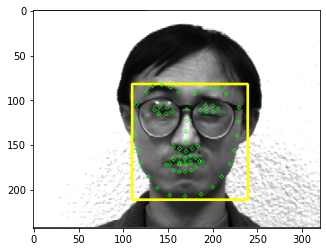

yalefaces/train/subject09.wink.gif


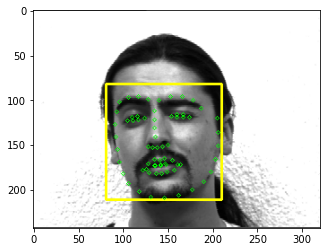

yalefaces/train/subject02.glasses.gif


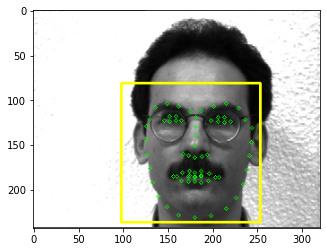

yalefaces/train/subject15.happy.gif


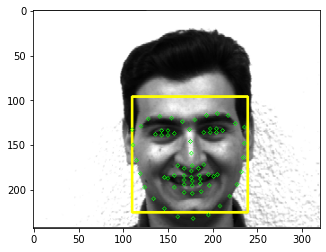

yalefaces/train/subject06.noglasses.gif


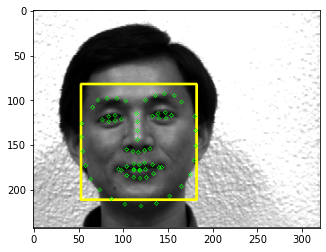

yalefaces/train/subject11.noglasses.gif


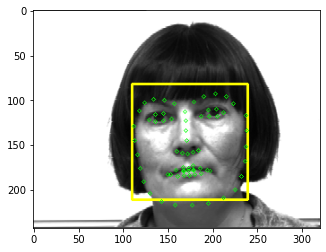

yalefaces/train/subject03.sad.gif


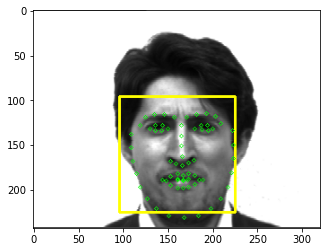

yalefaces/train/subject05.normal.gif


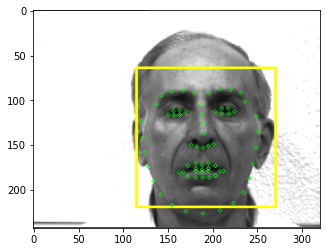

yalefaces/train/subject14.leftlight.gif


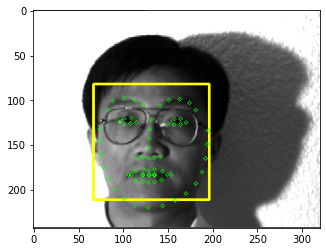

yalefaces/train/subject15.noglasses.gif


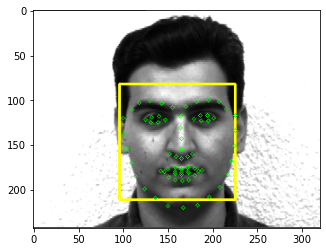

yalefaces/train/subject02.noglasses.gif


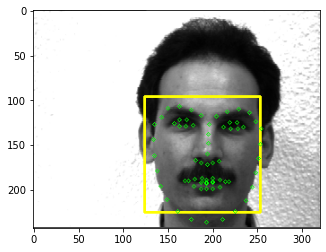

yalefaces/train/subject06.rightlight.gif


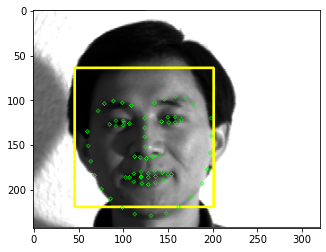

yalefaces/train/subject13.rightlight.gif


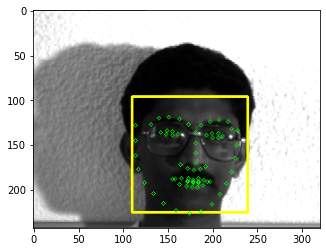

yalefaces/train/subject06.centerlight.gif


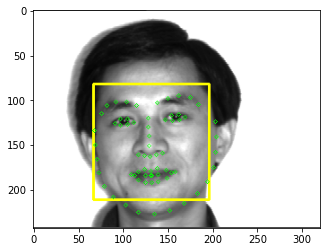

yalefaces/train/subject10.leftlight.gif


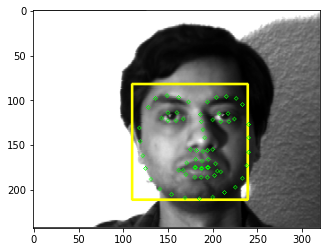

yalefaces/train/subject09.centerlight.gif


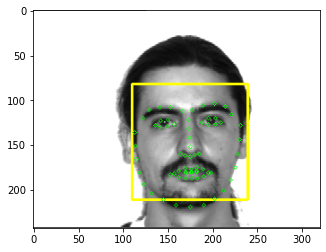

yalefaces/train/subject02.wink.gif


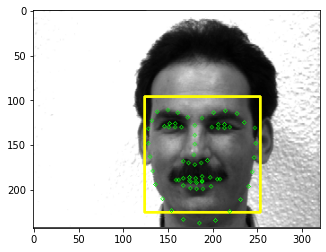

yalefaces/train/subject03.wink.gif


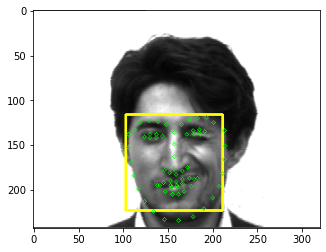

yalefaces/train/subject11.sleepy.gif


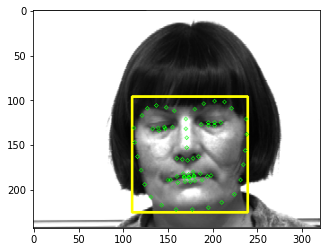

yalefaces/train/subject14.rightlight.gif


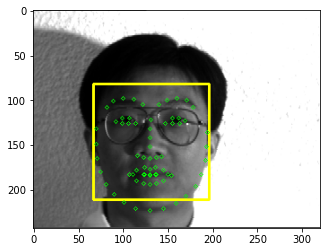

yalefaces/train/subject01.rightlight.gif


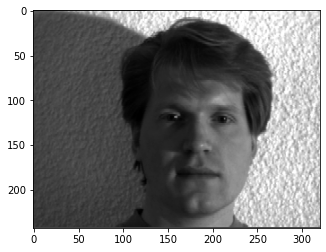

yalefaces/train/subject08.sleepy.gif


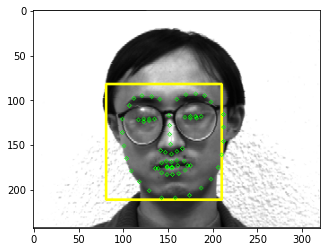

yalefaces/train/subject14.sleepy.gif


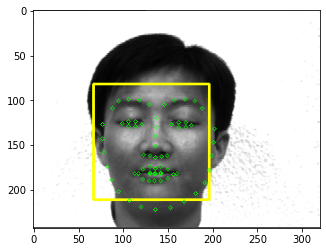

yalefaces/train/subject12.glasses.gif


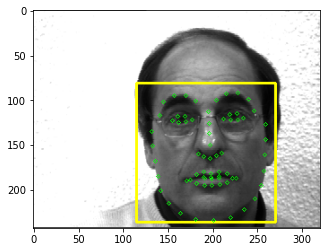

yalefaces/train/subject13.happy.gif


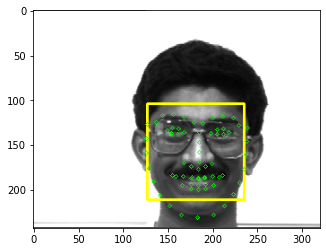

yalefaces/train/subject11.normal.gif


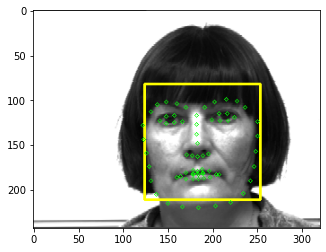

yalefaces/train/subject02.sad.gif


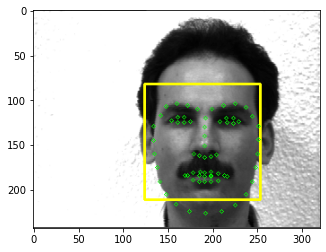

yalefaces/train/subject12.sad.gif


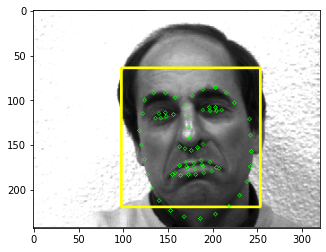

yalefaces/train/subject15.wink.gif


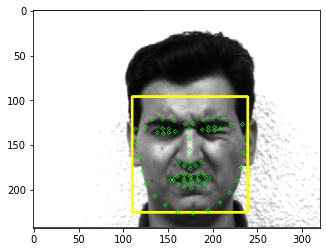

yalefaces/train/subject14.wink.gif


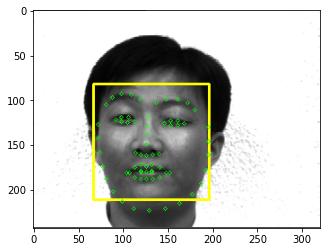

yalefaces/train/subject08.surprised.gif


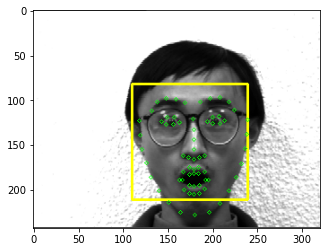

yalefaces/train/subject12.noglasses.gif


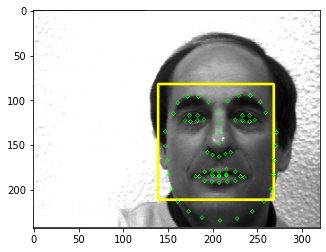

yalefaces/train/subject05.noglasses.gif


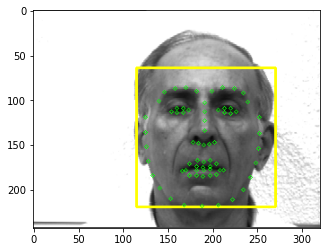

yalefaces/train/subject07.glasses.gif


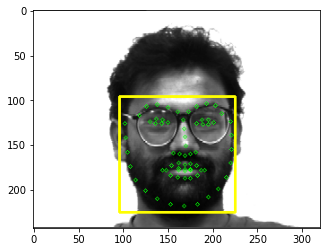

yalefaces/train/subject07.rightlight.gif


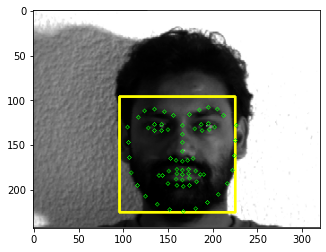

yalefaces/train/subject01.noglasses.gif


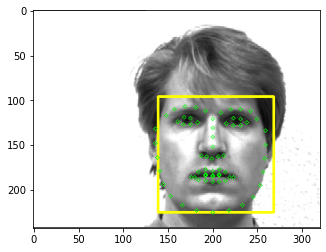

yalefaces/train/subject13.leftlight.gif


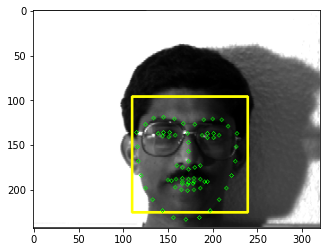

yalefaces/train/subject10.rightlight.gif


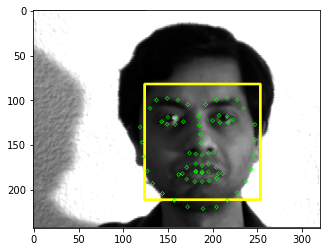

yalefaces/train/subject05.rightlight.gif


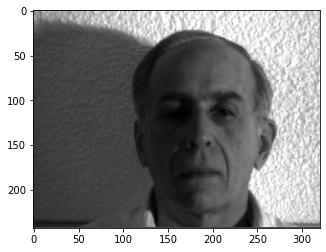

yalefaces/train/subject06.surprised.gif


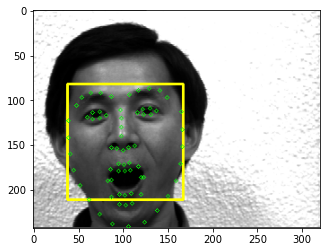

yalefaces/train/subject11.surprised.gif


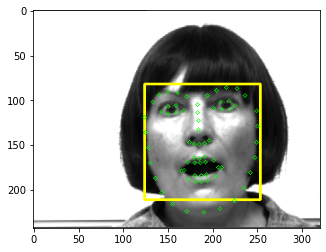

yalefaces/train/subject14.happy.gif


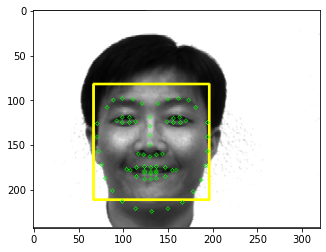

yalefaces/train/subject15.surprised.gif


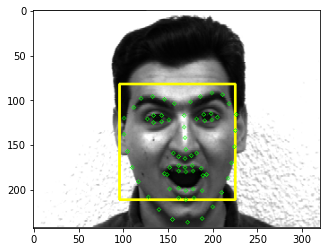

yalefaces/train/subject02.surprised.gif


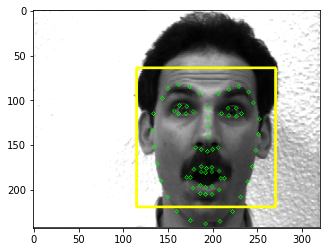

yalefaces/train/subject02.sleepy.gif


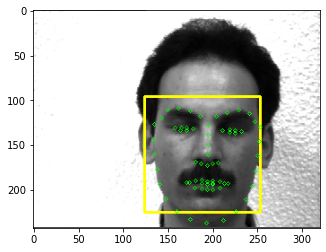

yalefaces/train/subject04.glasses.gif


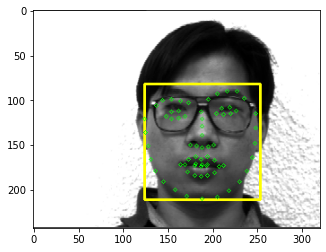

yalefaces/train/subject07.normal.gif


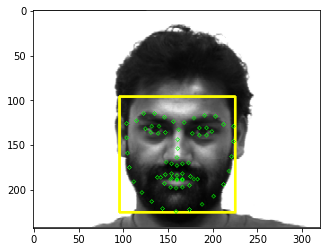

yalefaces/train/subject12.wink.gif


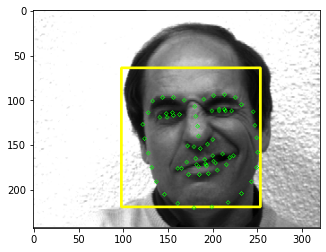

yalefaces/train/subject13.wink.gif


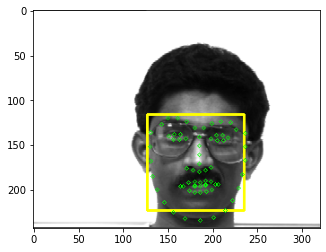

yalefaces/train/subject02.rightlight.gif


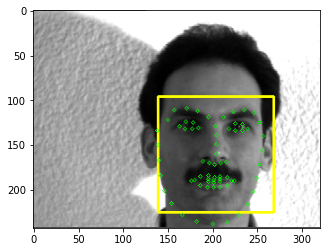

yalefaces/train/subject14.glasses.gif


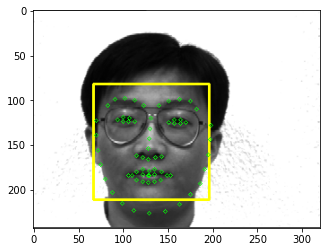

yalefaces/train/subject13.normal.gif


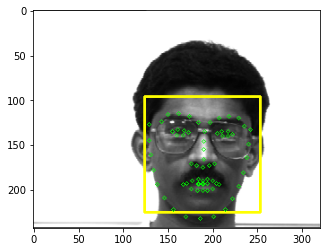

yalefaces/train/subject01.sad.gif


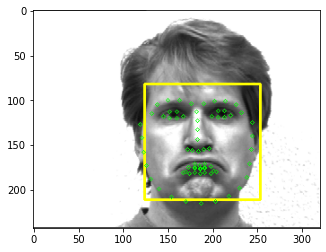

yalefaces/train/subject11.sad.gif


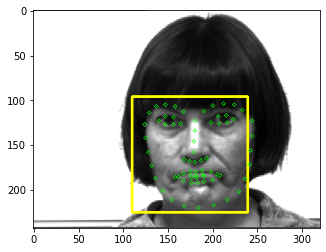

yalefaces/train/subject03.rightlight.gif


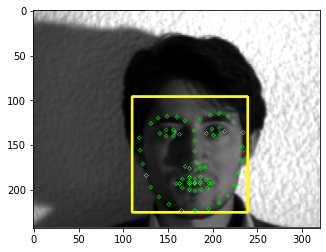

yalefaces/train/subject07.centerlight.gif


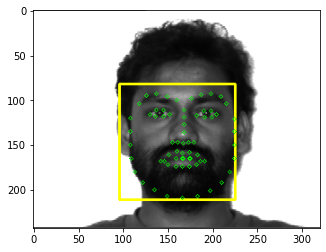

yalefaces/train/subject08.glasses.gif


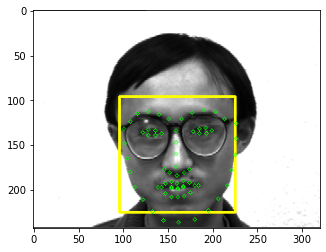

yalefaces/train/subject12.happy.gif


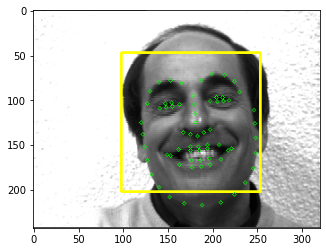

yalefaces/train/subject08.centerlight.gif


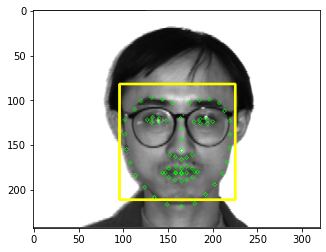

yalefaces/train/subject08.noglasses.gif


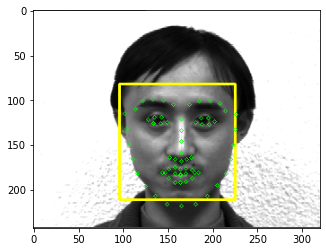

yalefaces/train/subject12.surprised.gif


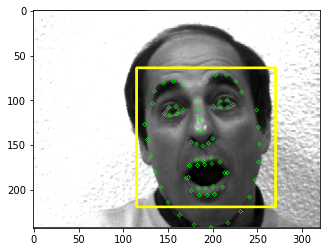

yalefaces/train/subject08.sad.gif


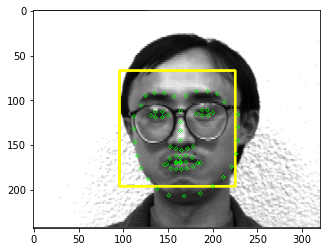

yalefaces/train/subject05.wink.gif


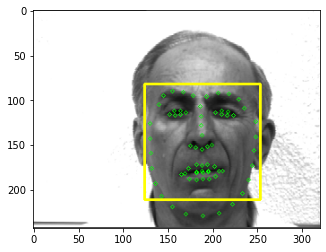

yalefaces/train/subject04.wink.gif


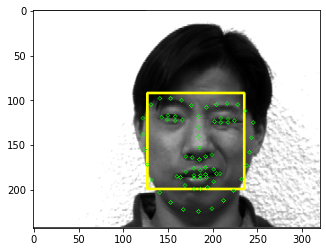

yalefaces/train/subject02.normal.gif


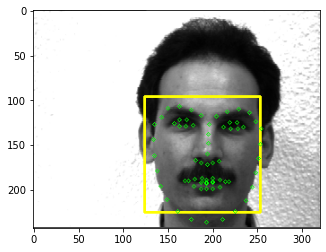

yalefaces/train/subject01.surprised.gif


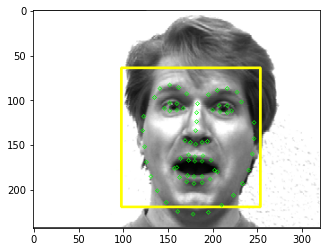

yalefaces/train/subject04.rightlight.gif


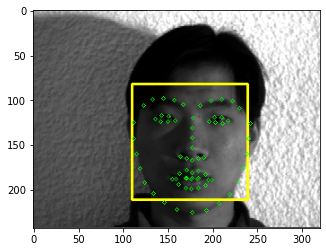

yalefaces/train/subject11.rightlight.gif


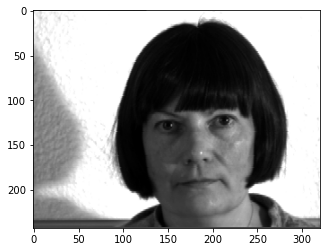

yalefaces/train/subject01.glasses.gif


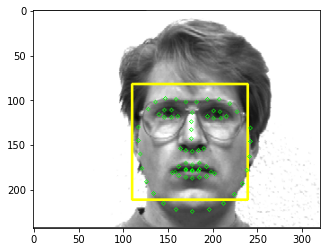

yalefaces/train/subject09.leftlight.gif


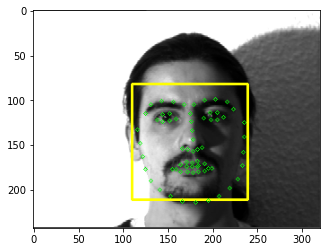

yalefaces/train/subject07.sleepy.gif


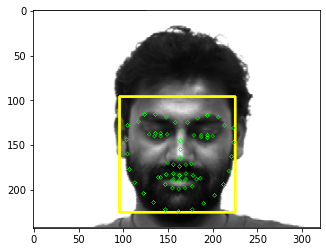

yalefaces/train/subject11.centerlight.gif


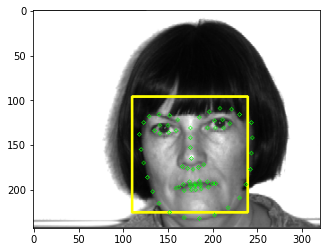

yalefaces/train/subject09.sleepy.gif


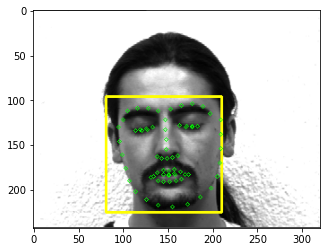

yalefaces/train/subject14.centerlight.gif


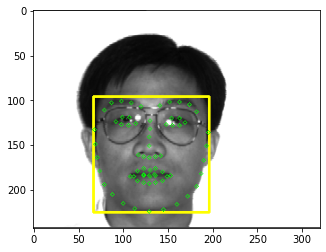

yalefaces/train/subject10.normal.gif


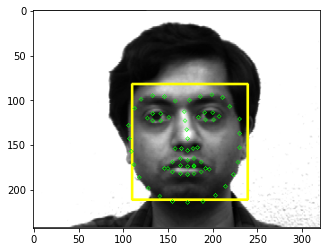

yalefaces/train/subject06.glasses.gif


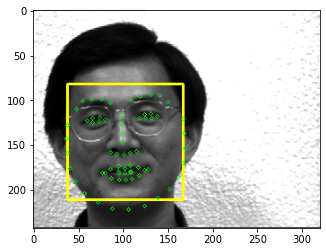

yalefaces/train/subject15.sleepy.gif


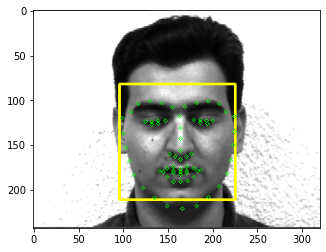

yalefaces/train/subject03.happy.gif


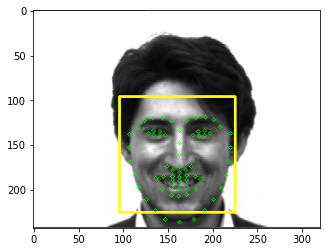

yalefaces/train/subject13.glasses.gif


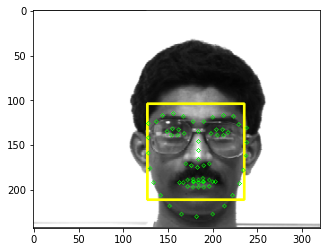

yalefaces/train/subject04.sleepy.gif


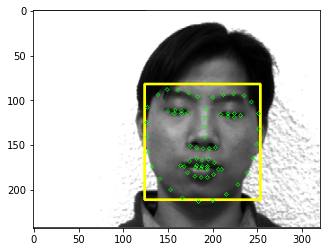

yalefaces/train/subject08.leftlight.gif


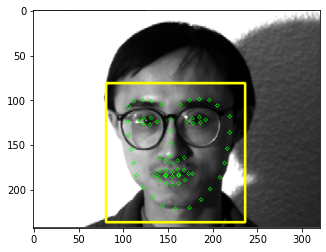

yalefaces/train/subject01.normal.gif


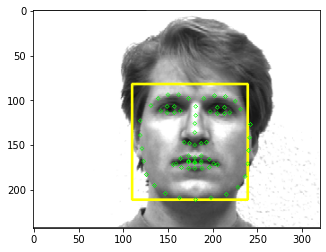

yalefaces/train/subject04.sad.gif


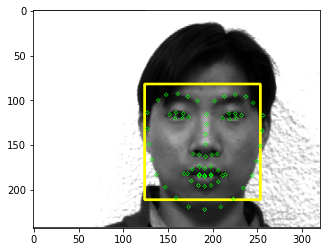

yalefaces/train/subject09.noglasses.gif


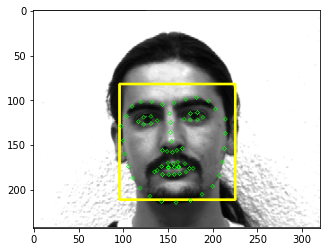

yalefaces/train/subject13.surprised.gif


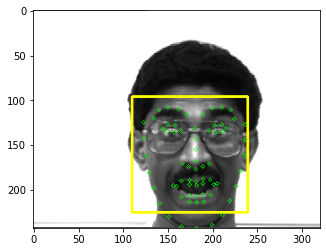

yalefaces/train/subject04.normal.gif


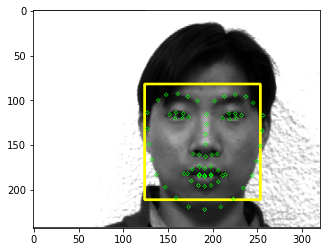

yalefaces/train/subject05.centerlight.gif


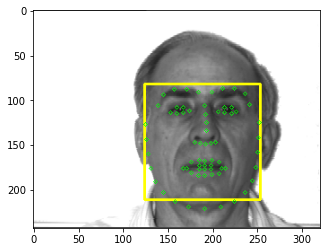

yalefaces/train/subject03.surprised.gif


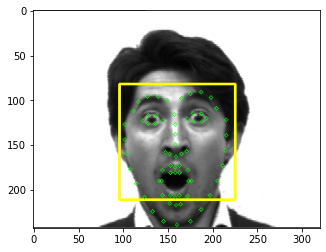

yalefaces/train/subject05.happy.gif


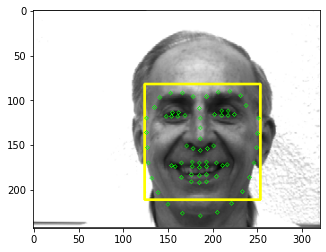

yalefaces/train/subject01.wink.gif


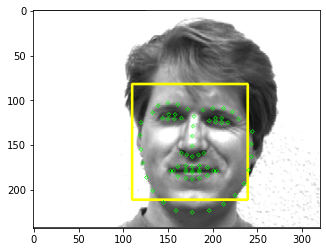

yalefaces/train/subject14.surprised.gif


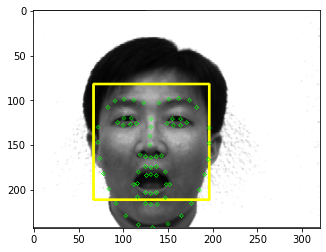

yalefaces/train/subject01.sleepy.gif


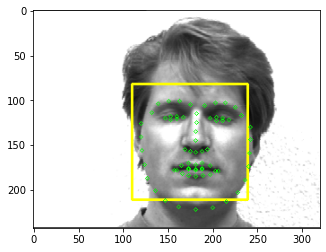

yalefaces/train/subject05.sad.gif


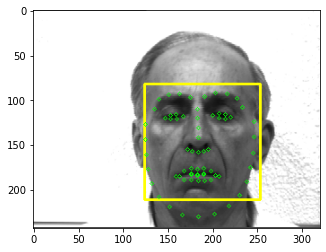

yalefaces/train/subject10.surprised.gif


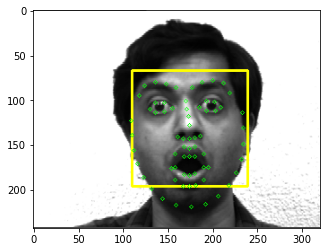

yalefaces/train/subject07.surprised.gif


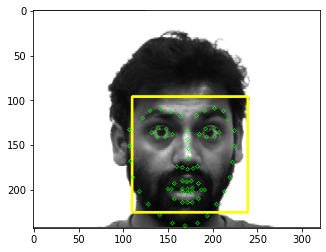

yalefaces/train/subject08.happy.gif


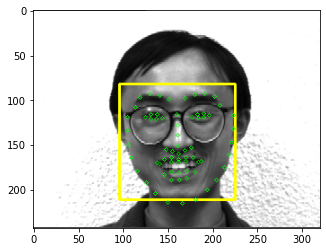

yalefaces/train/subject09.normal.gif


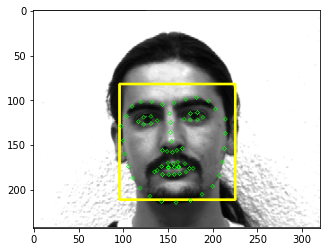

yalefaces/train/subject13.centerlight.gif


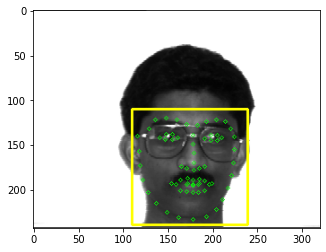

yalefaces/train/subject10.sleepy.gif


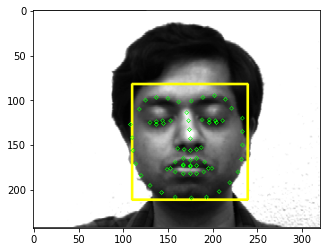

yalefaces/train/subject15.normal.gif


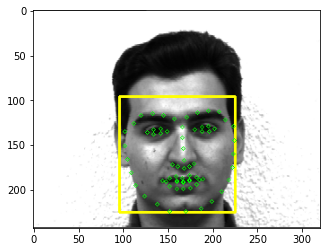

yalefaces/train/subject06.wink.gif


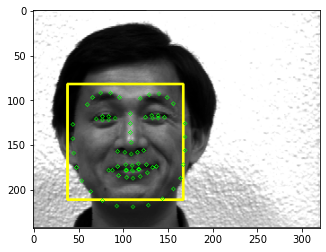

yalefaces/train/subject07.wink.gif


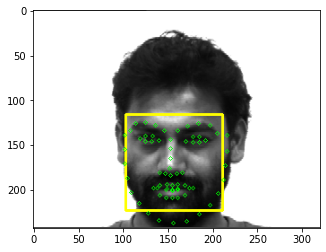

yalefaces/train/subject04.centerlight.gif


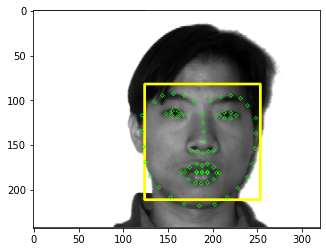

yalefaces/train/subject07.sad.gif


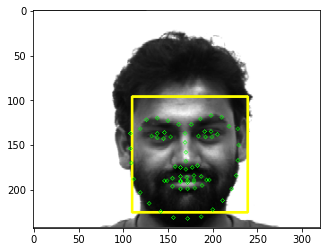

yalefaces/train/subject02.happy.gif


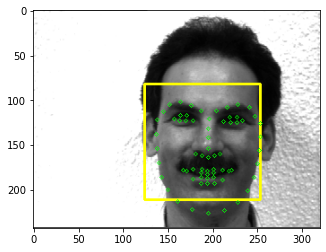

yalefaces/train/subject05.leftlight.gif


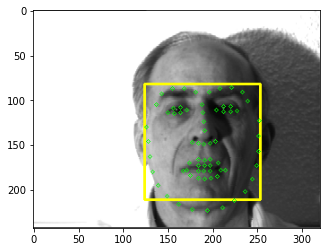

yalefaces/train/subject12.leftlight.gif


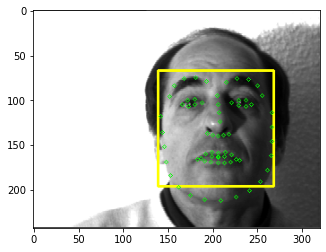

yalefaces/train/subject12.centerlight.gif


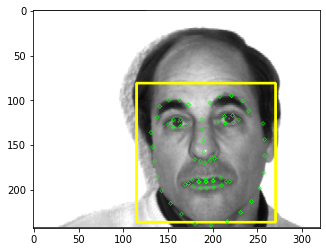

yalefaces/train/subject09.glasses.gif


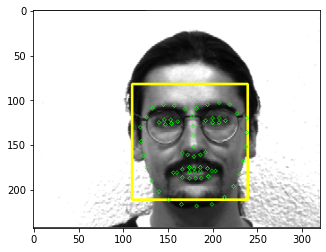

yalefaces/train/subject01.leftlight.gif


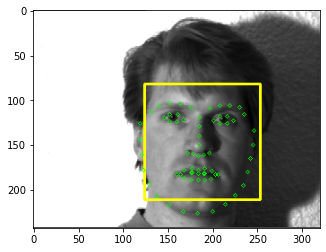

yalefaces/train/subject06.sleepy.gif


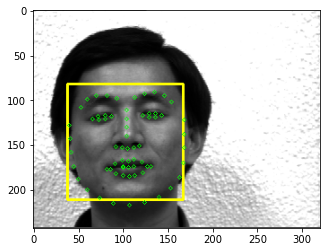

yalefaces/train/subject15.glasses.gif


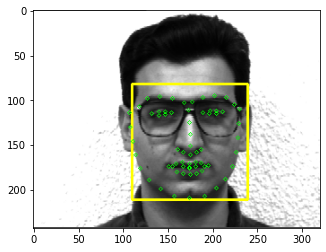

yalefaces/train/subject04.noglasses.gif


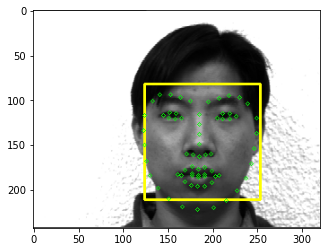

yalefaces/train/subject03.normal.gif


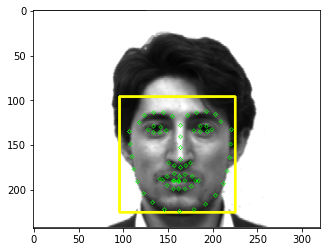

yalefaces/train/subject09.surprised.gif


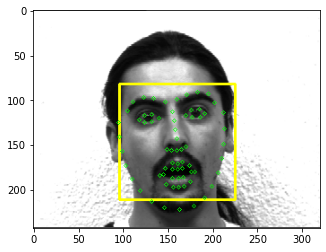

yalefaces/train/subject13.noglasses.gif


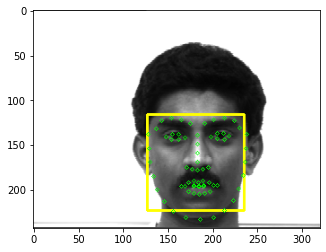

yalefaces/train/subject04.happy.gif


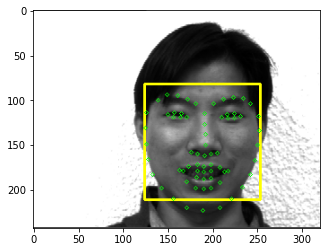

yalefaces/train/subject11.leftlight.gif


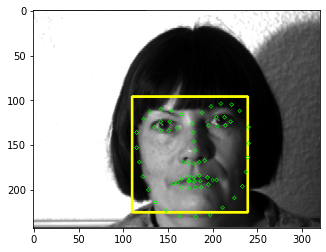

yalefaces/train/subject11.wink.gif


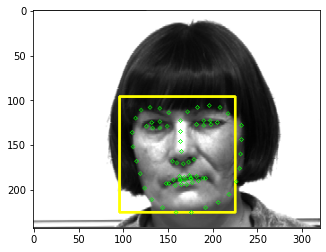

yalefaces/train/subject10.wink.gif


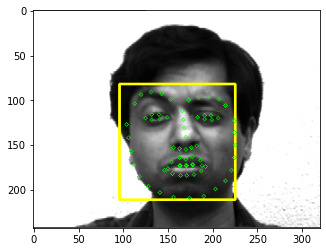

yalefaces/train/subject03.noglasses.gif


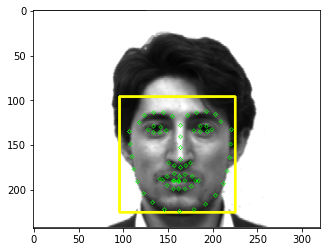

yalefaces/train/subject10.happy.gif


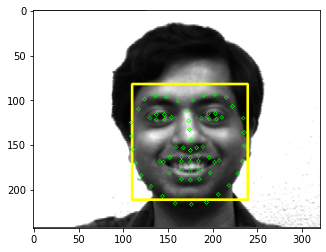

yalefaces/train/subject14.noglasses.gif


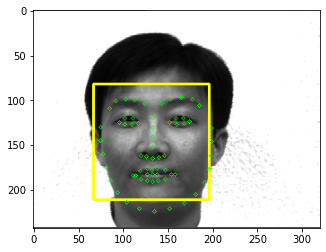

yalefaces/train/subject06.normal.gif


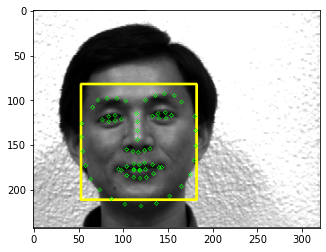

yalefaces/train/subject15.leftlight.gif


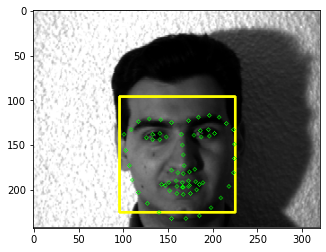

yalefaces/train/subject10.glasses.gif


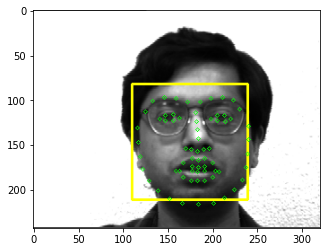

yalefaces/train/subject10.noglasses.gif


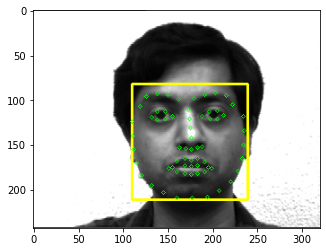

yalefaces/train/subject15.centerlight.gif


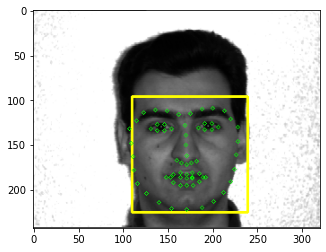

yalefaces/train/subject03.sleepy.gif


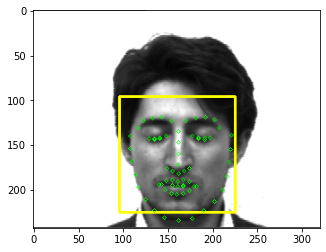

yalefaces/train/subject07.noglasses.gif


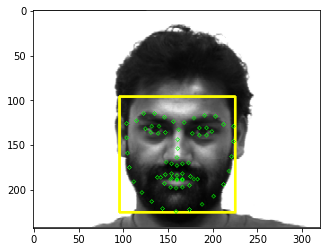

yalefaces/train/subject05.glasses.gif


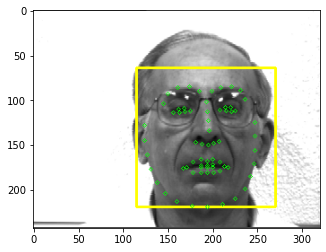

yalefaces/train/subject12.sleepy.gif


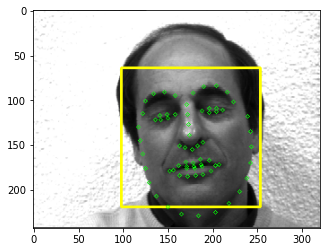

yalefaces/train/subject09.happy.gif


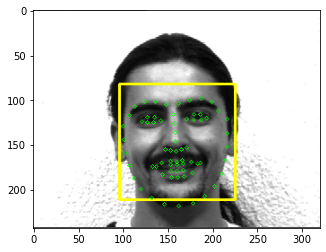

yalefaces/train/subject03.centerlight.gif


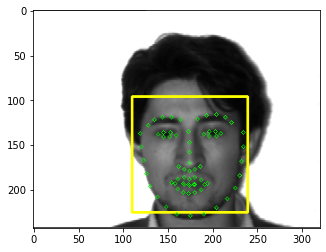

yalefaces/train/subject06.sad.gif


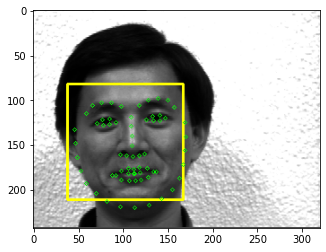

In [40]:
index = {}
idx = 0
face_descriptors = None

paths = [os.path.join("yalefaces/train",f) for f in os.listdir("yalefaces/train")]
for path in paths:
    print(path)
    image = Image.open(path).convert("RGB")
    image_np = np.array(image,"uint8")
    face_detection = face_detector(image_np,1)
    for face in face_detection:
        l,t,r,b = face.left(),face.top(),face.right(),face.bottom()
        cv2.rectangle(image_np,(l,t),(r,b),(255,255,0),2)
        points = points_detector(image_np,face)
        for point in points.parts():
            cv2.circle(image_np,(point.x,point.y),2,(0,255,0),1)
    face_descriptor = face_descriptor_extractor.compute_face_descriptor(image_np,points)
    face_descriptor = [f for f in face_descriptor]
    face_descriptor = np.asarray(face_descriptor,dtype=np.float64)
    face_descriptor = face_descriptor[np.newaxis,:]
    if face_descriptors is None:
        face_descriptors = face_descriptor
    else:
        face_descriptors = np.concatenate((face_descriptors,face_descriptor),axis=0)
    index[idx] = path
    idx += 1
    plt.imshow(image_np)
    plt.show() 

In [49]:
index

{0: 'yalefaces/train/subject08.wink.gif',
 1: 'yalefaces/train/subject09.wink.gif',
 2: 'yalefaces/train/subject02.glasses.gif',
 3: 'yalefaces/train/subject15.happy.gif',
 4: 'yalefaces/train/subject06.noglasses.gif',
 5: 'yalefaces/train/subject11.noglasses.gif',
 6: 'yalefaces/train/subject03.sad.gif',
 7: 'yalefaces/train/subject05.normal.gif',
 8: 'yalefaces/train/subject14.leftlight.gif',
 9: 'yalefaces/train/subject15.noglasses.gif',
 10: 'yalefaces/train/subject02.noglasses.gif',
 11: 'yalefaces/train/subject06.rightlight.gif',
 12: 'yalefaces/train/subject13.rightlight.gif',
 13: 'yalefaces/train/subject06.centerlight.gif',
 14: 'yalefaces/train/subject10.leftlight.gif',
 15: 'yalefaces/train/subject09.centerlight.gif',
 16: 'yalefaces/train/subject02.wink.gif',
 17: 'yalefaces/train/subject03.wink.gif',
 18: 'yalefaces/train/subject11.sleepy.gif',
 19: 'yalefaces/train/subject14.rightlight.gif',
 20: 'yalefaces/train/subject01.rightlight.gif',
 21: 'yalefaces/train/subject08.

In [47]:
np.linalg.norm(face_descriptors[131]-face_descriptors[131])

0.0

In [48]:
np.linalg.norm(face_descriptors[131]-face_descriptors[0])

0.8345723330433937

In [50]:
np.linalg.norm(face_descriptors[11]-face_descriptors[12])

0.6102893437267212

In [51]:
np.linalg.norm(face_descriptors[18]-face_descriptors[21])

0.7881960141665424

In [52]:
np.linalg.norm(face_descriptors[102]-face_descriptors[79])

0.33059723687697473

In [54]:
np.linalg.norm(face_descriptors[102]-face_descriptors,axis=1)

array([0.58639897, 0.77506579, 0.8087769 , 0.82882784, 0.62816407,
       0.81123341, 0.77645505, 0.90775172, 0.6297445 , 0.81941651,
       0.84995455, 0.64858546, 0.75726641, 0.52113076, 0.7495594 ,
       0.82217658, 0.87007275, 0.73899299, 0.81253451, 0.58119332,
       0.76587631, 0.56409756, 0.51599049, 0.91811712, 0.80839841,
       0.78450935, 0.85780915, 0.91120151, 0.84511022, 0.53640203,
       0.6566165 , 0.91298181, 0.89578966, 0.7865346 , 0.8150927 ,
       0.88536424, 0.84249107, 0.78007366, 0.97245704, 0.59116348,
       0.77986337, 0.55420866, 0.87185992, 0.86531061, 0.78936666,
       0.49236789, 0.87028818, 0.91713136, 0.7835547 , 0.83743839,
       0.549929  , 0.82542175, 0.88080467, 0.74252143, 0.6539563 ,
       0.83926707, 0.56809485, 0.87487538, 0.55272051, 0.574592  ,
       0.8877815 , 0.59494705, 0.87812467, 0.43968883, 0.84995455,
       0.90164131, 0.39780756, 0.80498868, 0.89108237, 0.72352999,
       0.84622129, 0.84134762, 0.74612944, 0.53833148, 0.79840

In [61]:
np.argmin(np.linalg.norm(face_descriptors[0]-face_descriptors[1:],axis=1))

20

In [62]:
np.linalg.norm(face_descriptors[0]-face_descriptors[1:],axis=1)[20]

0.2785794664266586

### Dlib: detecting faces

yalefaces/test/subject13.sad.gif


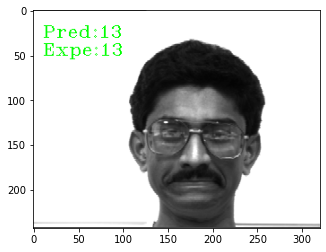

yalefaces/test/subject01.happy.gif


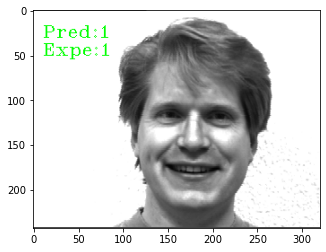

yalefaces/test/subject03.leftlight.gif


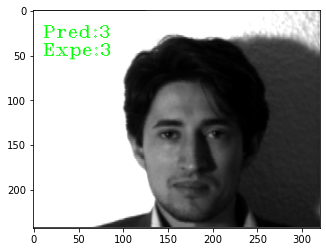

yalefaces/test/subject07.leftlight.gif


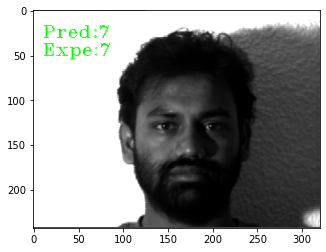

yalefaces/test/subject09.rightlight.gif


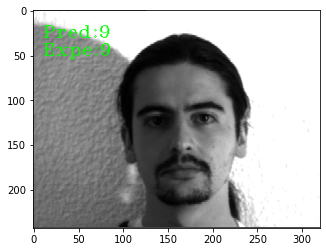

yalefaces/test/subject08.normal.gif


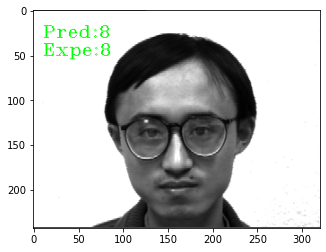

yalefaces/test/subject10.centerlight.gif


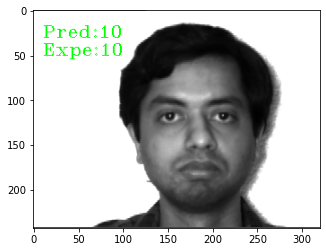

yalefaces/test/subject14.normal.gif


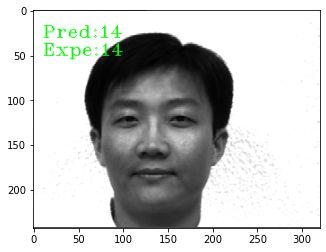

yalefaces/test/subject15.rightlight.gif


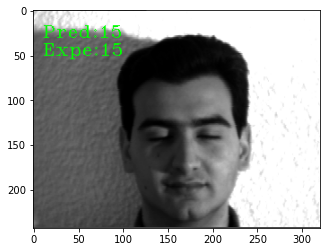

yalefaces/test/subject08.rightlight.gif


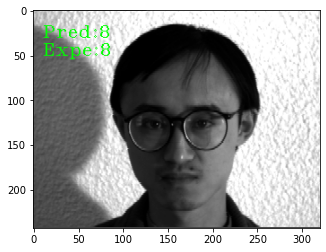

yalefaces/test/subject07.happy.gif


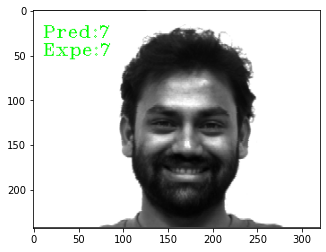

yalefaces/test/subject01.gif


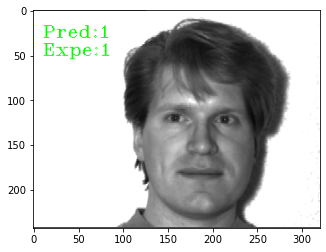

yalefaces/test/subject05.sleepy.gif


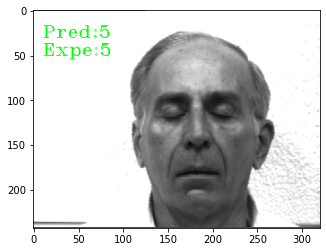

yalefaces/test/subject12.rightlight.gif


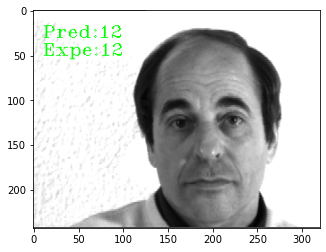

yalefaces/test/subject04.leftlight.gif


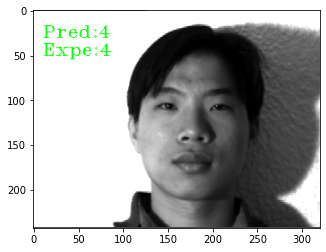

yalefaces/test/subject09.sad.gif


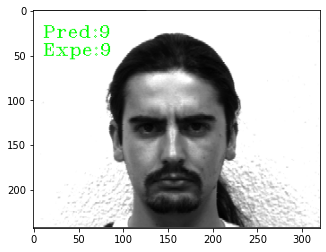

yalefaces/test/subject13.sleepy.gif


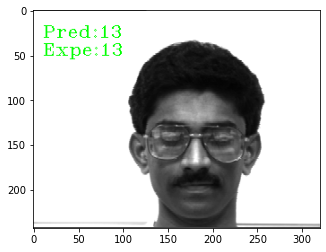

yalefaces/test/subject10.sad.gif


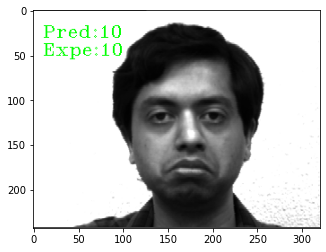

yalefaces/test/subject11.glasses.gif


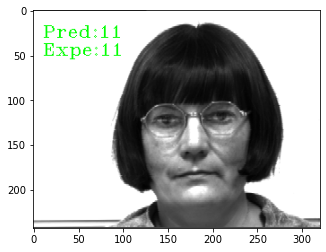

yalefaces/test/subject06.happy.gif


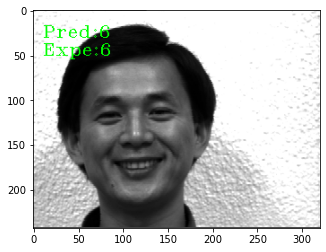

yalefaces/test/subject05.surprised.gif


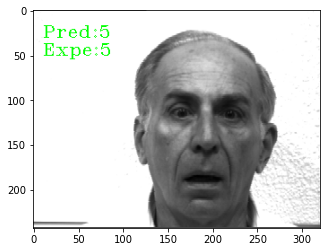

yalefaces/test/subject02.centerlight.gif


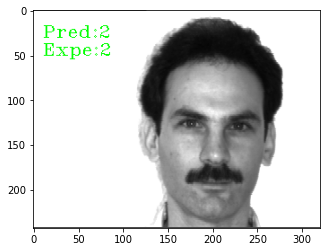

yalefaces/test/subject04.surprised.gif


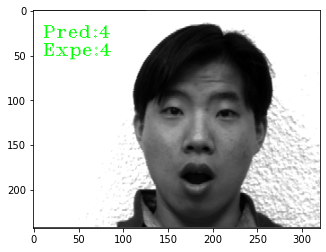

yalefaces/test/subject14.sad.gif


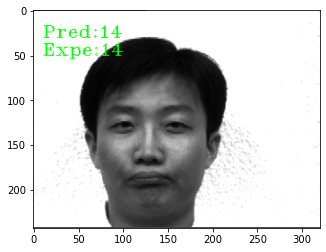

yalefaces/test/subject11.happy.gif


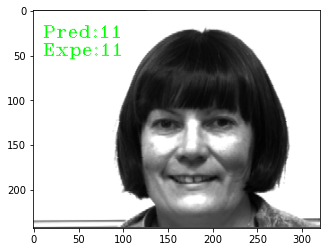

yalefaces/test/subject15.sad.gif


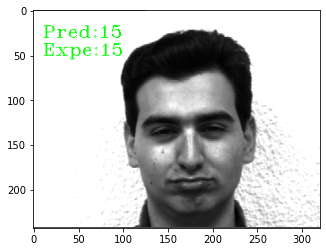

yalefaces/test/subject03.glasses.gif


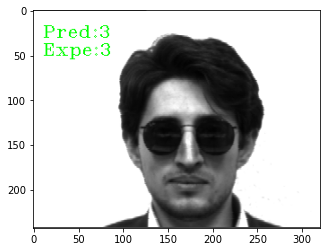

yalefaces/test/subject12.normal.gif


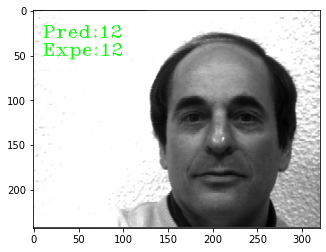

yalefaces/test/subject06.leftlight.gif


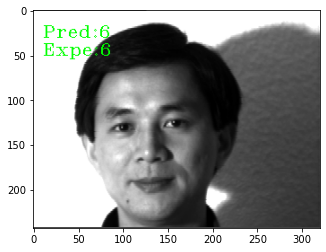

yalefaces/test/subject02.leftlight.gif


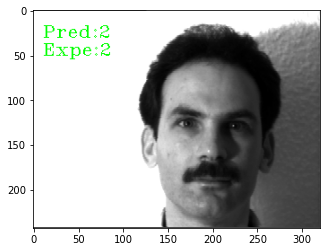

In [71]:
threshold = 0.5
predictions = []
expecteds = []

paths = [os.path.join("yalefaces/test",f) for f in os.listdir("yalefaces/test")]
for path in paths:
    print(path)
    image = Image.open(path).convert("RGB")
    image_np = np.array(image,"uint8")
    face_detection = face_detector(image_np,1)
    for face in face_detection:
        points = points_detector(image_np,face)
        face_descriptor = face_descriptor_extractor.compute_face_descriptor(image_np,points)
        face_descriptor = face_descriptor_extractor.compute_face_descriptor(image_np,points)
        face_descriptor = [f for f in face_descriptor]
        face_descriptor = np.asarray(face_descriptor,dtype=np.float64)
        face_descriptor = face_descriptor[np.newaxis,:]
        distances = np.linalg.norm(face_descriptor-face_descriptors,axis=1)
        min_index = np.argmin(distances)
        min_distance = distances[min_index]
        if min_distance <= threshold:
            name_pred = int(os.path.split(index[min_index])[1].split(".")[0][-2:])
        else:
            name_pred = "Not identified"
        name_real = int(os.path.split(path)[1].split(".")[0][-2:])
        predictions.append(name_pred)
        expecteds.append(name_real)
        cv2.putText(image_np,f"Pred:{name_pred}",(10,30),
                    cv2.FONT_HERSHEY_COMPLEX_SMALL,1,(0,255,0))
        cv2.putText(image_np,f"Expe:{name_real}",(10,50),
                    cv2.FONT_HERSHEY_COMPLEX_SMALL,1,(0,255,0))
    plt.imshow(image_np)
    plt.show() 

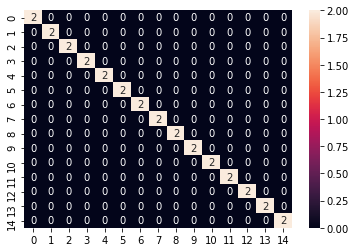

In [72]:
cm = confusion_matrix(expecteds,predictions)
seaborn.heatmap(cm,annot=True);

In [74]:
from sklearn.metrics import accuracy_score

acc = accuracy_score(expecteds,predictions)
print(f"Accuracy: {acc*100:.2f}%")

Accuracy: 100.00%
